<img src="https://github.com/retkowsky/visual-search-azureAI/blob/main/logo.jpg?raw=true">

# Fashion Visual Search demo

## 3. Visual search examples

This code demonstrates how to use **Azure Cognitive Search** with **Cognitive Services Florence Vision API** and Azure Python SDK for visual search.


## Steps
- Connect to a blob storage where your catalog images are
- Use Azure Computer Vision 4 to embed all these images
- Create an Azure Cognitive search vector store index
- Upload the embeddings into an Azure Cognitive Search index
- Do some visual search using a prompt or an image


## Visual search with vector embeddings
Vector embeddings are a way of representing content such as text or images as vectors of real numbers in a high-dimensional space. These embeddings are often learned from large amounts of textual and visual data using machine learning algorithms like neural networks. Each dimension of the vector corresponds to a different feature or attribute of the content, such as its semantic meaning, syntactic role, or context in which it commonly appears. By representing content as vectors, we can perform mathematical operations on them to compare their similarity or use them as inputs to machine learning models.

## Process
<img src="https://raw.githubusercontent.com/retkowsky/Azure-Computer-Vision-in-a-day-workshop/72c07afc4fcc04a29ca19b84d3d343a09a22368e//fashionprocess.png" width=512>

## Business applications
- Digital asset management: Image retrieval can be used to manage large collections of digital images, such as in museums, archives, or online galleries. Users can search for images based on visual features and retrieve the images that match their criteria.
- Medical image retrieval: Image retrieval can be used in medical imaging to search for images based on their diagnostic features or disease patterns. This can help doctors or researchers to identify similar cases or track disease progression.
- Security and surveillance: Image retrieval can be used in security and surveillance systems to search for images based on specific features or patterns, such as in, people & object tracking, or threat detection.
- Forensic image retrieval: Image retrieval can be used in forensic investigations to search for images based on their visual content or metadata, such as in cases of cyber-crime.
- E-commerce: Image retrieval can be used in online shopping applications to search for similar products based on their features or descriptions or provide recommendations based on previous purchases.
- Fashion and design: Image retrieval can be used in fashion and design to search for images based on their visual features, such as color, pattern, or texture. This can help designers or retailers to identify similar products or trends.

## To learn more
- https://learn.microsoft.com/en-us/azure/cognitive-services/computer-vision/concept-image-retrieval
- https://learn.microsoft.com/en-us/azure/search/search-what-is-azure-search

In this notebook we took some samples fashion images are taken from this link:<br>
https://www.kaggle.com/datasets/paramaggarwal/fashion-product-images-dataset

> Note: Image retrieval is curently in public preview

## 1. Python librairies

In [1]:
import datetime
import io
import json
import math
import matplotlib.pyplot as plt
import os
import requests
import sys

from dotenv import load_dotenv
from io import BytesIO
from PIL import Image

from azure.core.credentials import AzureKeyCredential
from azure.search.documents import SearchClient
from azure.search.documents.indexes import SearchIndexClient
from azure.search.documents.indexes import SearchIndexerClient
from azure.search.documents.models import Vector
from azure.search.documents.indexes.models import (
    SearchIndexerDataContainer,
    SearchIndexerDataSourceConnection,
    VectorSearch,
)

from azure.storage.blob import BlobServiceClient

In [2]:
sys.version

'3.8.5 (default, Sep  4 2020, 07:30:14) \n[GCC 7.3.0]'

In [3]:
print("Today is", datetime.datetime.today())

Today is 2023-06-26 09:17:30.385984


## 2. Azure AI Services

In [4]:
load_dotenv("azure.env")

# Azure Computer Vision 4
acv_key = os.getenv("acv_key")
acv_endpoint = os.getenv("acv_endpoint")

# Azure Cognitive Search
acs_endpoint = os.getenv("acs_endpoint")
acs_key = os.getenv("acs_key")

In [5]:
# Ensure that the azure endpoints should not finished a /
if acv_endpoint.endswith("/"):
    acv_endpoint = acv_endpoint[:-1]

if acs_endpoint.endswith("/"):
    acs_endpoint = acv_endpoint[:-1]

## 3. Functions & parameters

In [6]:
# Azure Cognitive Search index name to create
index_name = "azure-fashion-demo"

# Azure Cognitive Search api version
api_version = "2023-02-01-preview"

In [7]:
def text_embedding(prompt):
    """
    Text embedding using Azure Computer Vision 4.0
    """
    version = "?api-version=" + api_version + "&modelVersion=latest"
    vec_txt_url = f"{acv_endpoint}/computervision/retrieval:vectorizeText{version}"
    headers = {"Content-type": "application/json", "Ocp-Apim-Subscription-Key": acv_key}

    payload = {"text": prompt}
    response = requests.post(vec_txt_url, json=payload, headers=headers)

    if response.status_code == 200:
        text_emb = response.json().get("vector")
        return text_emb

    else:
        print(f"Error: {response.status_code} - {response.text}")
        return None

In [8]:
session = requests.Session()


def image_embedding(imagefile):
    """
    Image embedding using Azure Computer Vision 4.0
    """
    version = "?api-version=" + api_version + "&modelVersion=latest"
    vec_img_url = acv_endpoint + "/computervision/retrieval:vectorizeImage" + version
    headers = {
        "Content-type": "application/octet-stream",
        "Ocp-Apim-Subscription-Key": acv_key,
    }

    try:
        blob_service_client = BlobServiceClient.from_connection_string(
            blob_connection_string
        )
        container_client = blob_service_client.get_container_client(container_name)

        blob_client = container_client.get_blob_client(imagefile)
        stream = BytesIO()
        blob_data = blob_client.download_blob()
        blob_data.readinto(stream)

        stream.seek(0)  # Reset stream position to the beginning

        response = session.post(vec_img_url, data=stream, headers=headers)
        response.raise_for_status()  # Raise an exception if response status is not 200

        image_emb = response.json()["vector"]
        return image_emb

    except requests.exceptions.RequestException as e:
        print(f"Request Exception: {e}")
    except Exception as ex:
        print(f"Error: {ex}")

    return None

In [9]:
def get_cosine_similarity(vector1, vector2):
    """
    Get cosine similarity value between two embedded vectors
    """
    dot_product = sum(x * y for x, y in zip(vector1, vector2))
    magnitude1 = math.sqrt(sum(x * x for x in vector1))
    magnitude2 = math.sqrt(sum(x * x for x in vector2))
    cosine_similarity = dot_product / (magnitude1 * magnitude2)

    return cosine_similarity

In [10]:
def url_image_embedding(image_url):
    """
    Image embedding with Azure Computer Vision using an image URL
    """
    url = f"{acv_endpoint}/computervision/retrieval:vectorizeImage"
    params = {"api-version": api_version}
    headers = {"Content-Type": "application/json", "Ocp-Apim-Subscription-Key": acv_key}
    data = {"url": image_url}

    try:
        response = requests.post(url, params=params, headers=headers, json=data)
        response.raise_for_status()  # Raise an exception for non-2xx status codes
        embeddings = response.json()["vector"]
        return embeddings

    except requests.exceptions.RequestException as e:
        print(f"Error: {e}")
        return None

In [11]:
def prompt_search(prompt, topn=5, disp=False):
    """
    Azure Cognitive visual search using a prompt
    """
    results_list = []

    # Initialize the Azure Cognitive Search client
    search_client = SearchClient(acs_endpoint, index_name, AzureKeyCredential(acs_key))
    # Perform vector search
    vector = Vector(value=text_embedding(prompt), k=topn, fields="imagevector")
    response = search_client.search(
        search_text=prompt, vector=vector, select=["idfile", "imagefile"]
    )
    print("\033[1;31;34m")
    print("Finding images using prompt =", prompt, "\n")

    for nb, result in enumerate(response, 1):
        image_file = result["imagefile"]
        results_list.append(image_file)
        if disp:
            print(f"Top {nb:02} : {image_file}")

    return results_list

In [12]:
def image_search(image_url, topn=5, disp=False):
    """
    Azure Cognitive Visual search using an image
    """
    results_list = []

    # Initialize the Azure Cognitive Search client
    search_client = SearchClient(acs_endpoint, index_name, AzureKeyCredential(acs_key))

    # Perform vector search
    response = search_client.search(
        search_text="",
        vector=Vector(
            value=url_image_embedding(image_url), k=topn, fields="imagevector"
        ),
        select=["idfile", "imagefile"],
    )

    print("\033[1;31;34m")
    print("Reference image:", image_url)
    image_ref = Image.open(BytesIO(requests.get(image_url).content))
    image_ref.thumbnail((360, 360), Image.LANCZOS)
    display(image_ref)
    print("\033[1;31;34m")

    for nb, result in enumerate(response, 1):
        image_file = result["imagefile"]
        results_list.append(image_file)
        if disp:
            print("Top", nb, ":", image_file)

    return results_list

In [13]:
def display_images(images_list, num_cols=5, disp_cosine=False, source="prompt"):
    """
    Display multiple images
    """
    num_images = len(images_list)
    num_rows = (num_images + num_cols - 1) // num_cols
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 12))

    if disp_cosine and source == "prompt":
        cos_list = [
            get_cosine_similarity(text_embedding(prompt), image_embedding(image))
            for image in images_list
        ]

    if disp_cosine and source == "image":
        cos_list = [
            get_cosine_similarity(
                url_image_embedding(image_url), image_embedding(image)
            )
            for image in images_list
        ]

    for idx, ax in enumerate(axes.flat):
        if idx < num_images:
            blob_client = container_client.get_blob_client(images_list[idx])
            blob_image = blob_client.download_blob().readall()
            ax.axis("off")
            # Display image
            image = Image.open(io.BytesIO(blob_image))
            ax.imshow(image)
            topnid = idx + 1
            title = f"Top {topnid:02}\n{images_list[idx]}"

            if disp_cosine:
                title += f"\nCosine similarity = {round(cos_list[idx], 5)}"
            ax.set_title(title)

        else:
            ax.axis("off")

    plt.tight_layout()
    plt.show()

In [14]:
def index_stats(index_name):
    """
    Get statistics about Azure Cognitive Search index
    """
    url = (
        acs_endpoint
        + "/indexes/"
        + index_name
        + "/stats?api-version=2021-04-30-Preview"
    )
    headers = {
        "Content-Type": "application/json",
        "api-key": acs_key,
    }
    response = requests.get(url, headers=headers)
    print("Azure Cognitive Search index status for:", index_name, "\n")

    if response.status_code == 200:
        res = response.json()
        print(json.dumps(res, indent=2))

    else:
        print("Request failed with status code:", response.status_code)

In [15]:
def index_status(index_name):
    """
    Azure Cognitive Search index status
    """
    print("Azure Cognitive Search Index:", index_name, "\n")

    headers = {"Content-Type": "application/json", "api-key": acs_key}
    params = {"api-version": "2021-04-30-Preview"}
    index_status = requests.get(
        acs_endpoint + "/indexes/" + index_name, headers=headers, params=params
    )
    try:
        print(json.dumps((index_status.json()), indent=5))
    except:
        print("Request failed")

In [16]:
EMBEDDINGS_DIR = "embeddings"

os.makedirs(EMBEDDINGS_DIR, exist_ok=True)

In [17]:
# Azure storage account
blob_connection_string = os.getenv("blob_connection_string")
container_name = os.getenv("container_name")

In [18]:
# Create a data source
ds_client = SearchIndexerClient(acs_endpoint, AzureKeyCredential(acs_key))
container = SearchIndexerDataContainer(name=container_name)
data_source_connection = SearchIndexerDataSourceConnection(
    name=f"{index_name}-blob",
    type="azureblob",
    connection_string=blob_connection_string,
    container=container,
)
data_source = ds_client.create_or_update_data_source_connection(data_source_connection)

print(f"Done. Data source '{data_source.name}' has been created or updated.")

Done. Data source 'azure-fashion-demo-blob' has been created or updated.


In [19]:
# Connect to Blob Storage
blob_service_client = BlobServiceClient.from_connection_string(blob_connection_string)
container_client = blob_service_client.get_container_client(container_name)
blobs = container_client.list_blobs()

first_blob = next(blobs)
blob_url = container_client.get_blob_client(first_blob).url
print(f"URL of the first blob: {blob_url}")

URL of the first blob: https://azurestorageaccountsr.blob.core.windows.net/fashionimages/fashion/0390469004.jpg


In [20]:
list_of_images = container_client.list_blobs()

images_list = []

for image in list_of_images:
    imagefile = image["name"]
    images_list.append(imagefile)

In [21]:
print("Number of catalog images =", len(images_list))

Number of catalog images = 10226


## 4. Azure Cognitive Search

In [22]:
try:
    # Setting the Azure Cognitive Search client
    print("Setting the Azure Cognitive Search client")
    search_client = SearchIndexClient(
        endpoint=acs_endpoint, credential=AzureKeyCredential(acs_key)
    )
    print("Done")
    print(search_client)

except:
    print("Request failed. Cannot create Azure Cognitive Search client:", acs_endpoint)

Setting the Azure Cognitive Search client
Done


### Azure Cognitive Search index status

In [23]:
index_stats(index_name)

Azure Cognitive Search index status for: azure-fashion-demo 

{
  "@odata.context": "https://azurecogsearcheastussr.search.windows.net/$metadata#Microsoft.Azure.Search.V2021_04_30_Preview.IndexStatistics",
  "documentCount": 10226,
  "storageSize": 155600569
}


In [24]:
index_status(index_name)

Azure Cognitive Search Index: azure-fashion-demo 

{
     "@odata.context": "https://azurecogsearcheastussr.search.windows.net/$metadata#indexes/$entity",
     "@odata.etag": "\"0x8DB762519A6CB75\"",
     "name": "azure-fashion-demo",
     "defaultScoringProfile": null,
     "fields": [
          {
               "name": "idfile",
               "type": "Edm.String",
               "searchable": false,
               "filterable": false,
               "retrievable": true,
               "sortable": false,
               "facetable": false,
               "key": true,
               "indexAnalyzer": null,
               "searchAnalyzer": null,
               "analyzer": null,
               "normalizer": null,
               "synonymMaps": []
          },
          {
               "name": "imagefile",
               "type": "Edm.String",
               "searchable": true,
               "filterable": false,
               "retrievable": true,
               "sortable": false,
        

### Quick test on a basic text search

In [25]:
search_client = SearchClient(acs_endpoint, index_name, AzureKeyCredential(acs_key))

text = "0392168018"
print("Let's query the index with text =", text, "\n")

response = search_client.search(search_text=text)

for result in response:
    print("Id file:", result["idfile"])
    print("Filename:", result["imagefile"])
    print("Vector embedding size:", len(result["imagevector"]))

Let's query the index with text = 0392168018 

Id file: 31
Filename: fashion/0392168018.jpg
Vector embedding size: 1024


> Azure Cognitive Search index is defined. We can now do some visual search using a text or an image

## 5. Visual Search using a prompt


Finding images using prompt = A red dress 



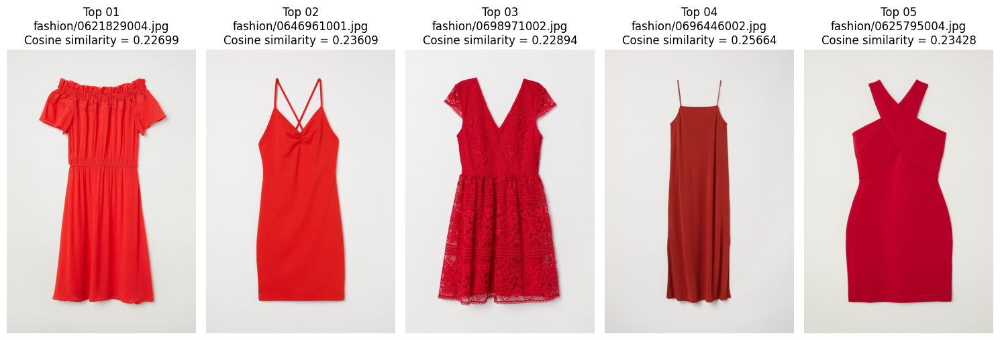

In [26]:
prompt = "A red dress"

images = prompt_search(prompt, topn=5)
display_images(images, disp_cosine=True, source="prompt")


Finding images using prompt = Articles with birds 



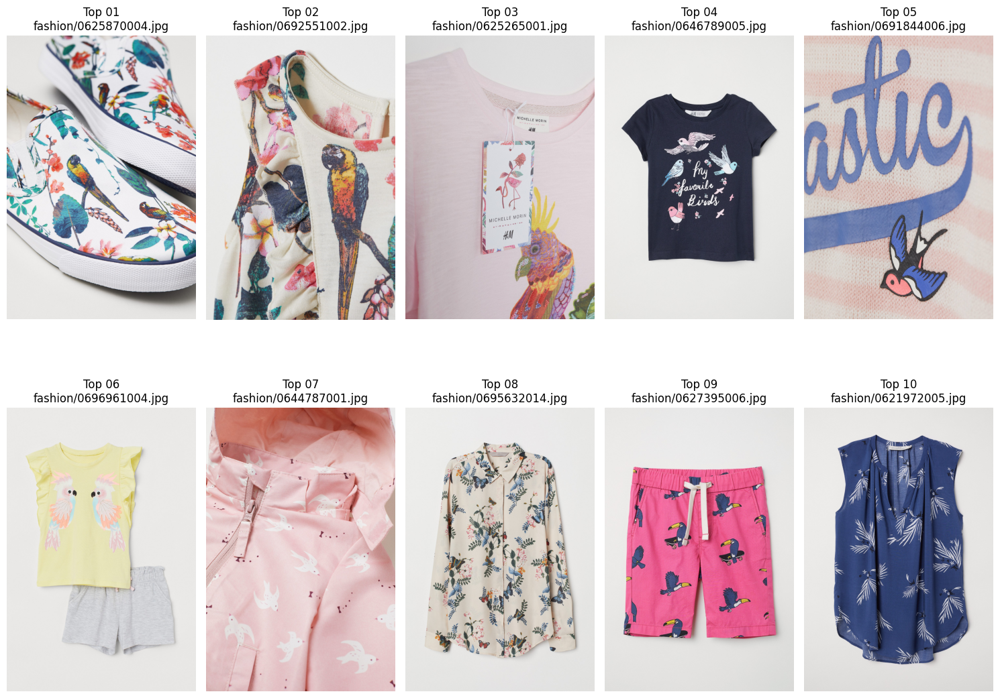

In [27]:
prompt = "Articles with birds"

images = prompt_search(prompt, topn=10)
display_images(images, disp_cosine=False, source="prompt")


Finding images using prompt = Articles with sharks, fishes or whales on it 

Top 01 : fashion/0697813035.jpg
Top 02 : fashion/0697813009.jpg
Top 03 : fashion/0645879001.jpg
Top 04 : fashion/0693720001.jpg
Top 05 : fashion/0696356004.jpg
Top 06 : fashion/0694659019.jpg


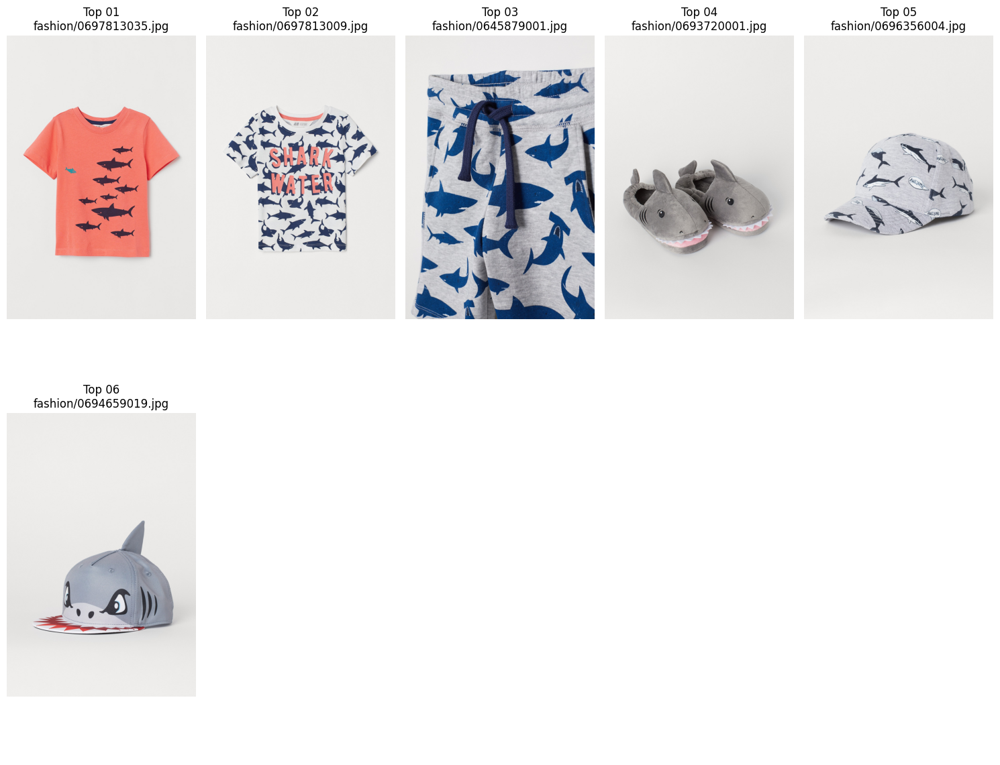

In [28]:
prompt = "Articles with sharks, fishes or whales on it"

images = prompt_search(prompt, topn=6, disp=True)
display_images(images, disp_cosine=False, source="prompt")


Finding images using prompt = Hair products 



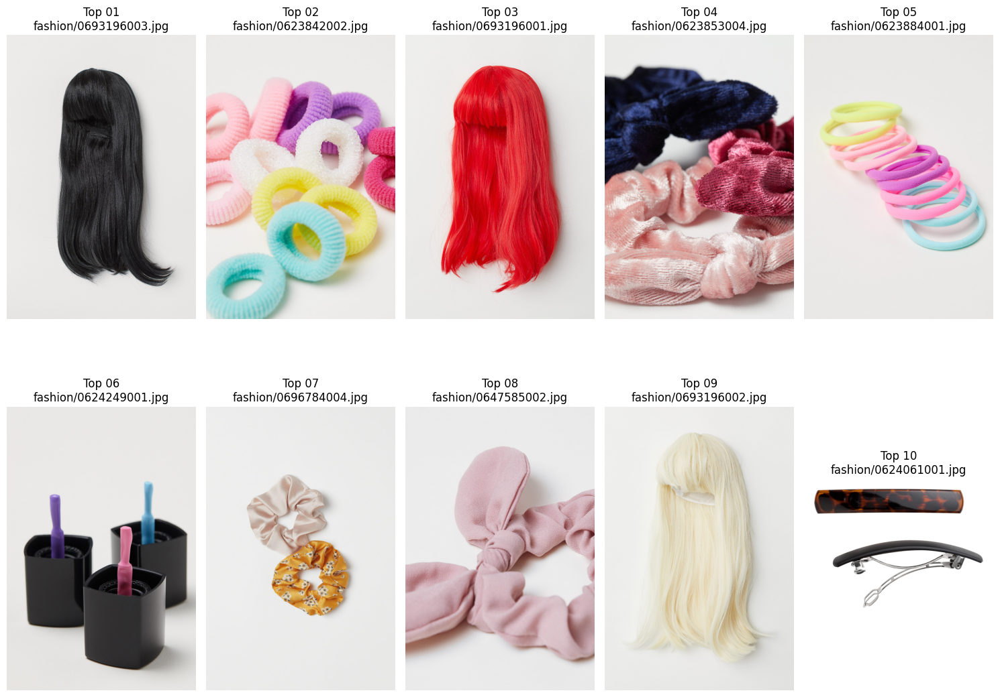

In [29]:
prompt = "Hair products"

images = prompt_search(prompt, topn=10)
display_images(images, disp_cosine=False, source="prompt")


Finding images using prompt = Camo products 



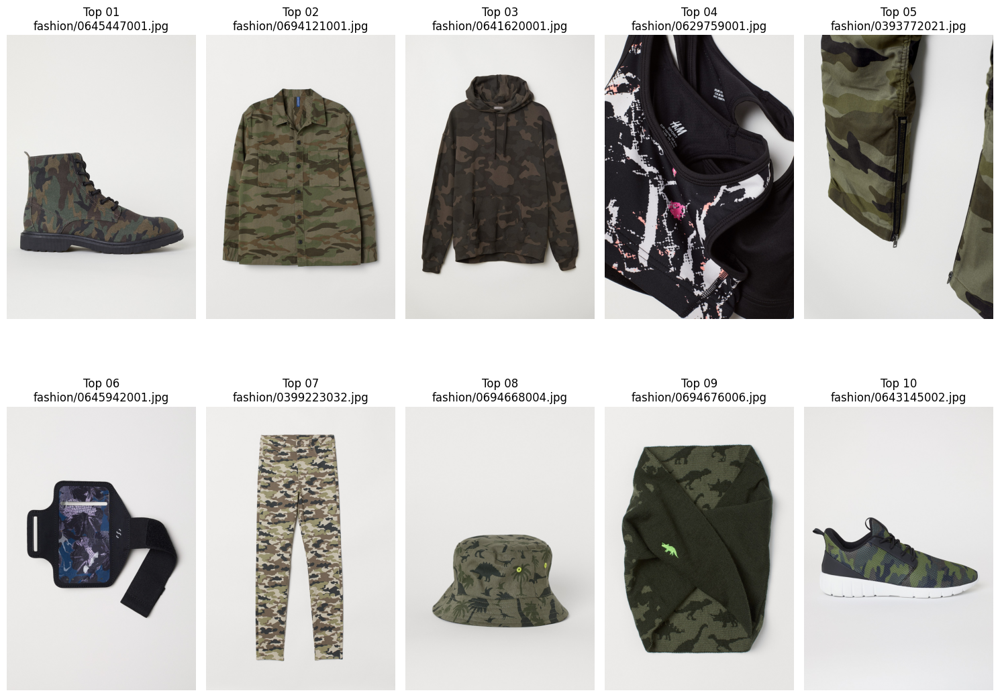

In [30]:
prompt = "Camo products"

images = prompt_search(prompt, topn=10)
display_images(images, disp_cosine=False, source="prompt")


Finding images using prompt = A blue shirt with stripped lines 



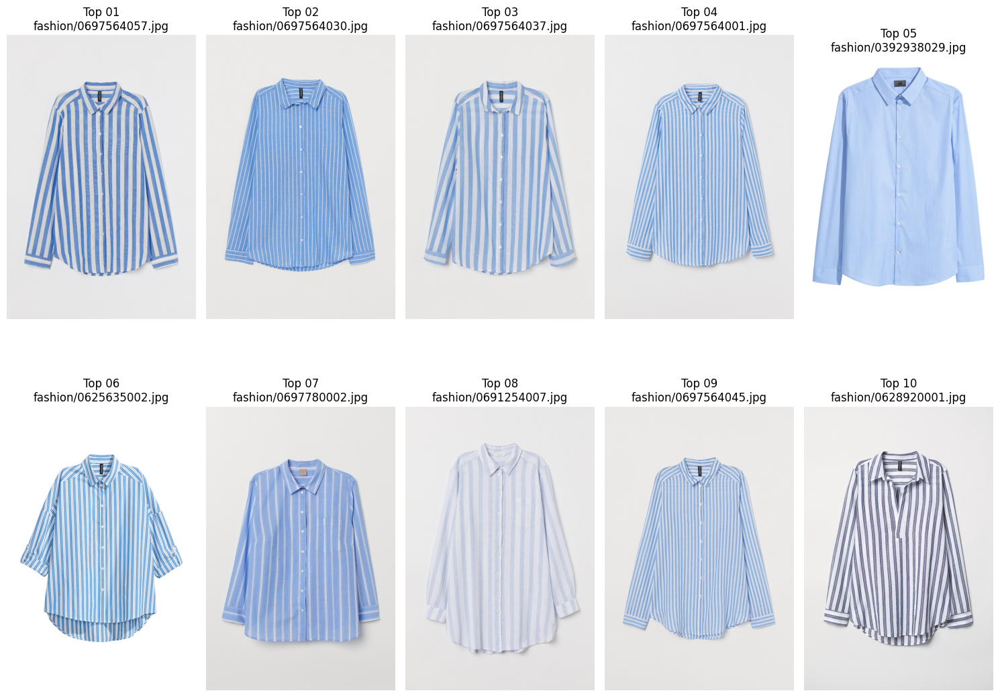

In [31]:
prompt = "A blue shirt with stripped lines"

images = prompt_search(prompt, topn=10)
display_images(images, disp_cosine=False, source="prompt")


Finding images using prompt = Ray ban with leopard frames 



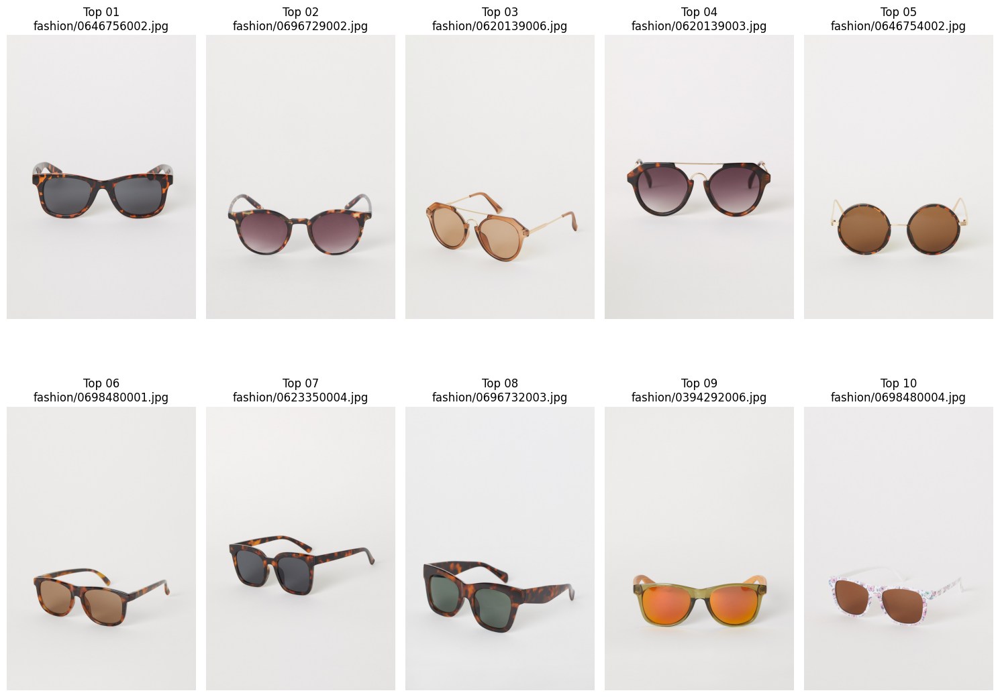

In [32]:
prompt = "Ray ban with leopard frames"

images = prompt_search(prompt, topn=10)
display_images(images, disp_cosine=False, source="prompt")


Finding images using prompt = Show me some articles with Italian names 



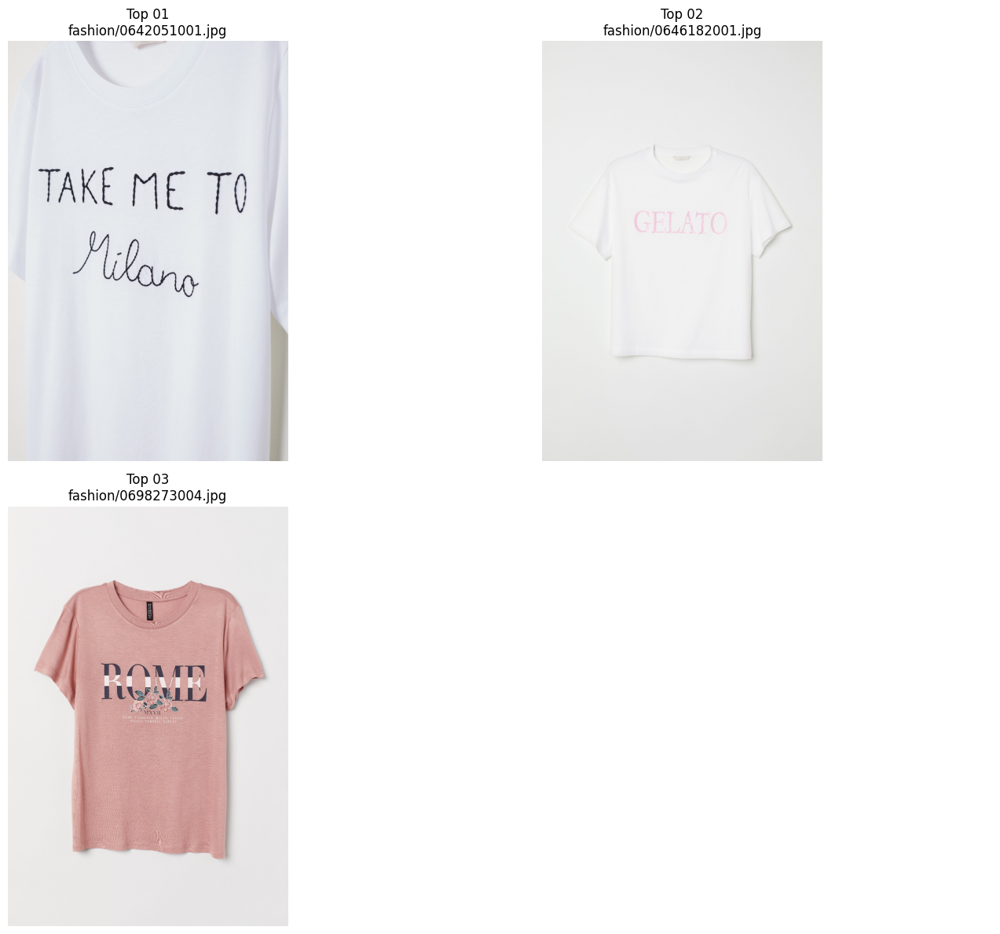

In [33]:
prompt = "Show me some articles with Italian names"

images = prompt_search(prompt, topn=3)
display_images(images, disp_cosine=False, num_cols=2, source="prompt")


Finding images using prompt = Show me some articles with Japanese on it 



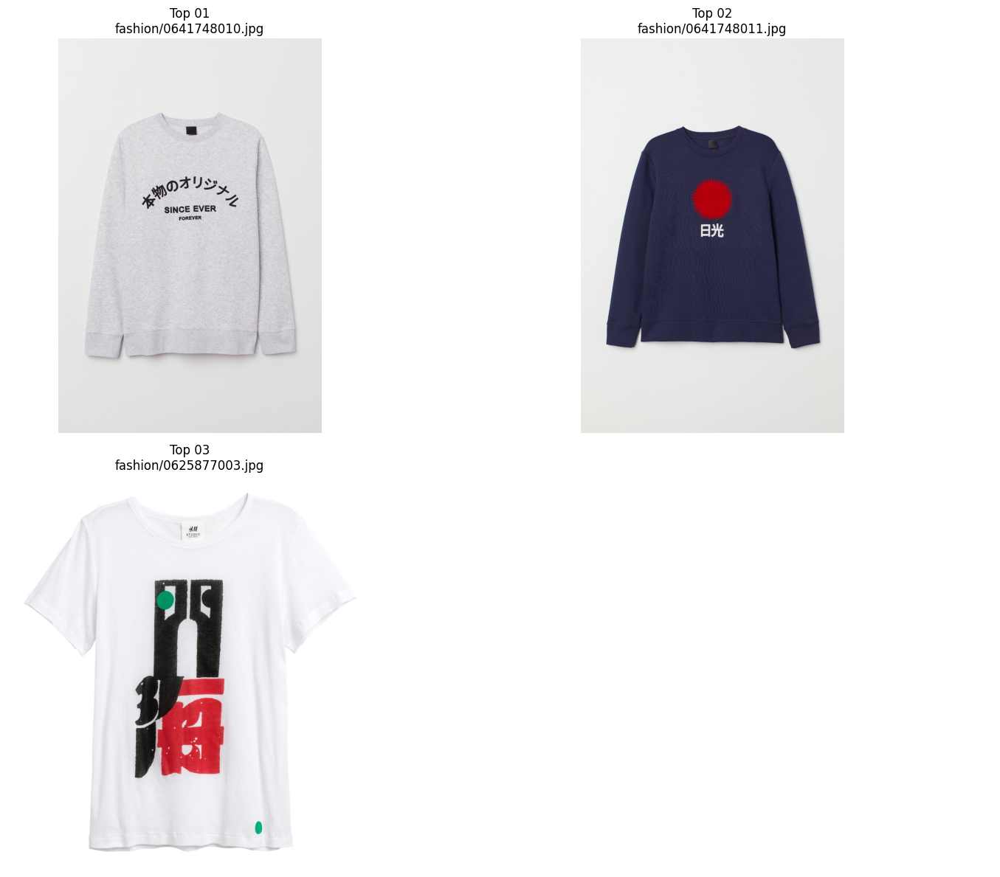

In [34]:
prompt = "Show me some articles with Japanese on it"

images = prompt_search(prompt, topn=3)
display_images(images, disp_cosine=False, num_cols=2, source="prompt")


Finding images using prompt = Show me some tie-dye articles 



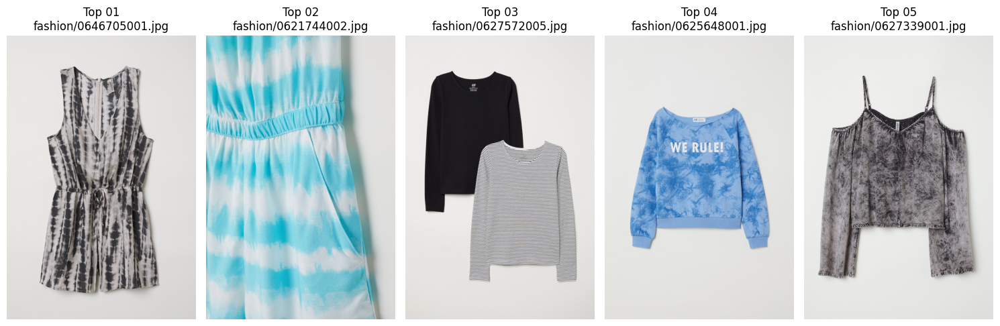

In [35]:
prompt = "Show me some tie-dye articles"

images = prompt_search(prompt, topn=5)
display_images(images, disp_cosine=False, source="prompt")

## 6. Visual search using an image

In [36]:
images_url = "https://github.com/retkowsky/images/blob/master/"


Reference image: https://github.com/retkowsky/images/blob/master/visualsearch%20(1).jpg?raw=true


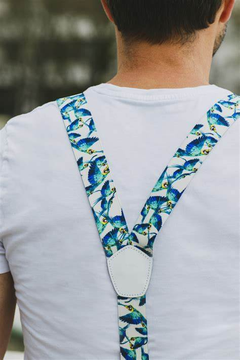

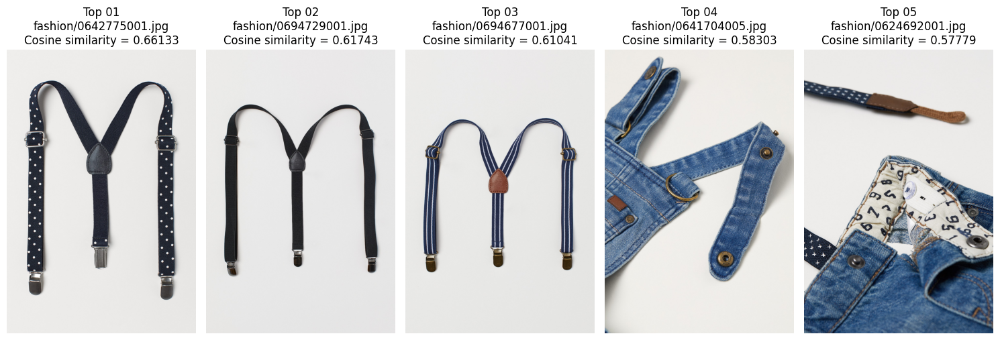

In [37]:
image_url = images_url + "visualsearch%20(1).jpg?raw=true"

images = image_search(image_url, disp=False)
display_images(images, disp_cosine=True, source="image")


Reference image: https://github.com/retkowsky/images/blob/master/visualsearch%20(2).jpg?raw=true


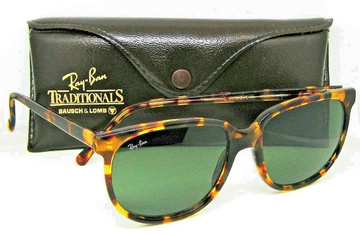

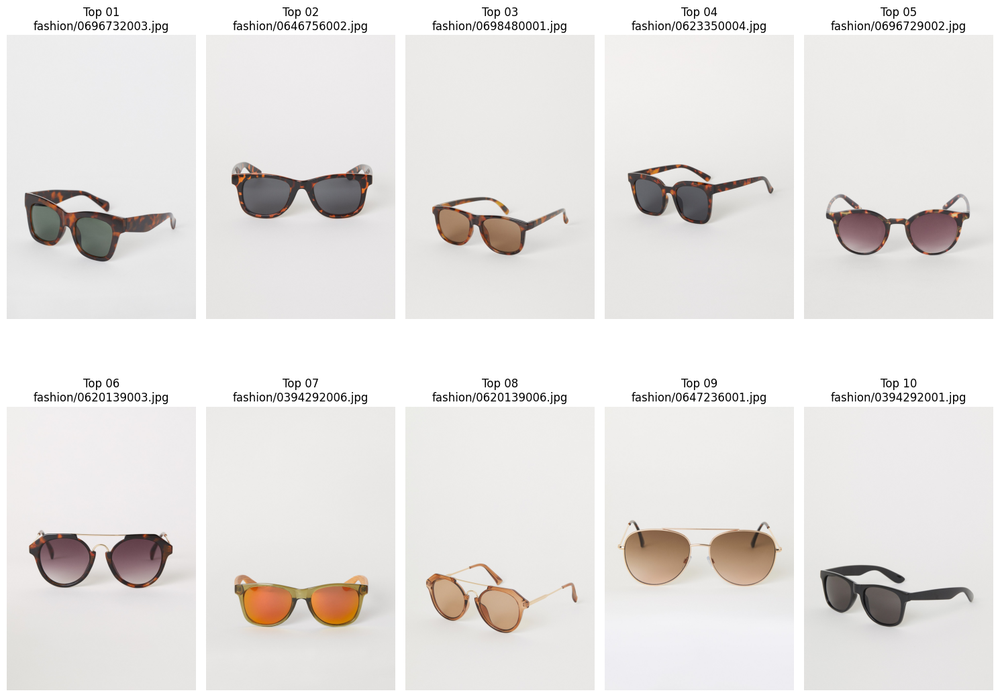

In [38]:
image_url = images_url + "visualsearch%20(2).jpg?raw=true"

images = image_search(image_url, topn=10)
display_images(images, disp_cosine=False, source="image")


Reference image: https://github.com/retkowsky/images/blob/master/visualsearch%20(4).jpg?raw=true


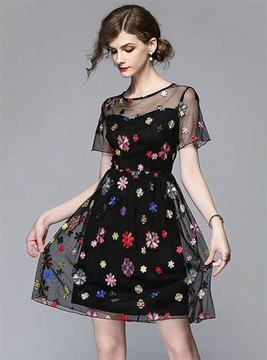

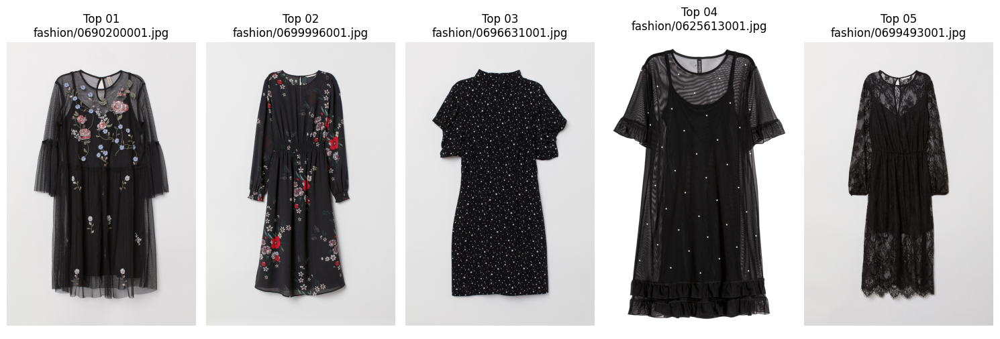

In [39]:
image_url = images_url + "visualsearch%20(4).jpg?raw=true"

images = image_search(image_url)
display_images(images, disp_cosine=False, source="image")


Reference image: https://github.com/retkowsky/images/blob/master/visualsearch%20(5).jpg?raw=true


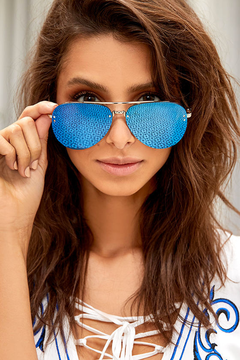

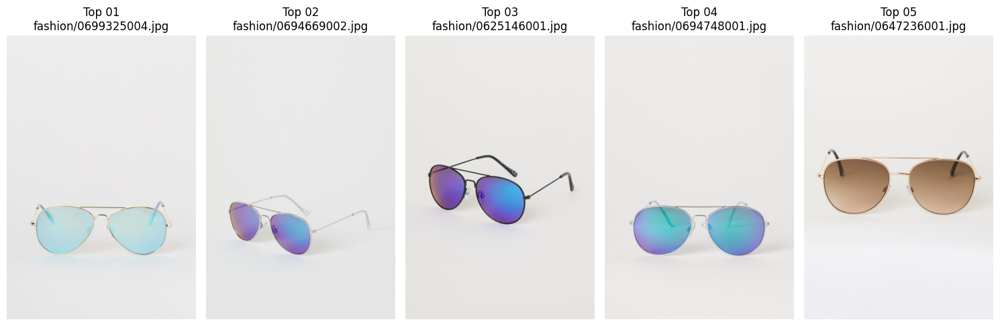

In [40]:
image_url = images_url + "visualsearch%20(5).jpg?raw=true"

images = image_search(image_url)
display_images(images, disp_cosine=False, source="image")


Reference image: https://github.com/retkowsky/images/blob/master/visualsearch%20(6).jpg?raw=true


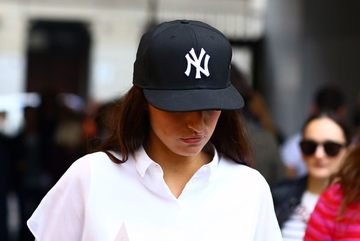

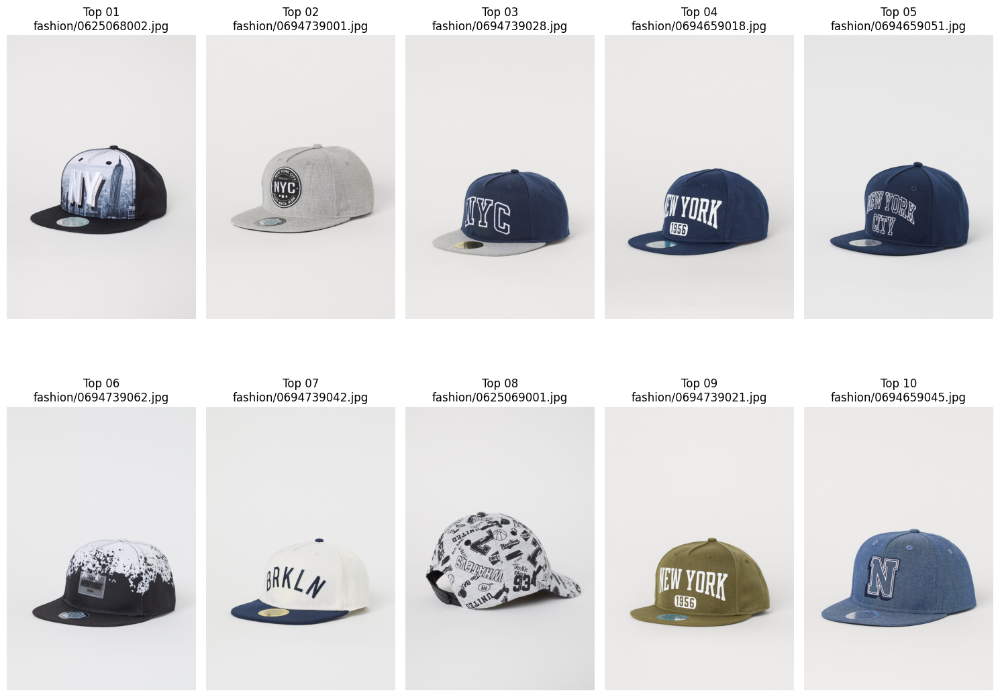

In [41]:
image_url = images_url + "visualsearch%20(6).jpg?raw=true"

images = image_search(image_url, topn=10)
display_images(images, disp_cosine=False, source="image")


Reference image: https://github.com/retkowsky/images/blob/master/visualsearch%20(7).jpg?raw=true


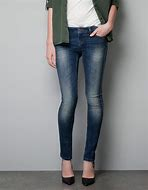

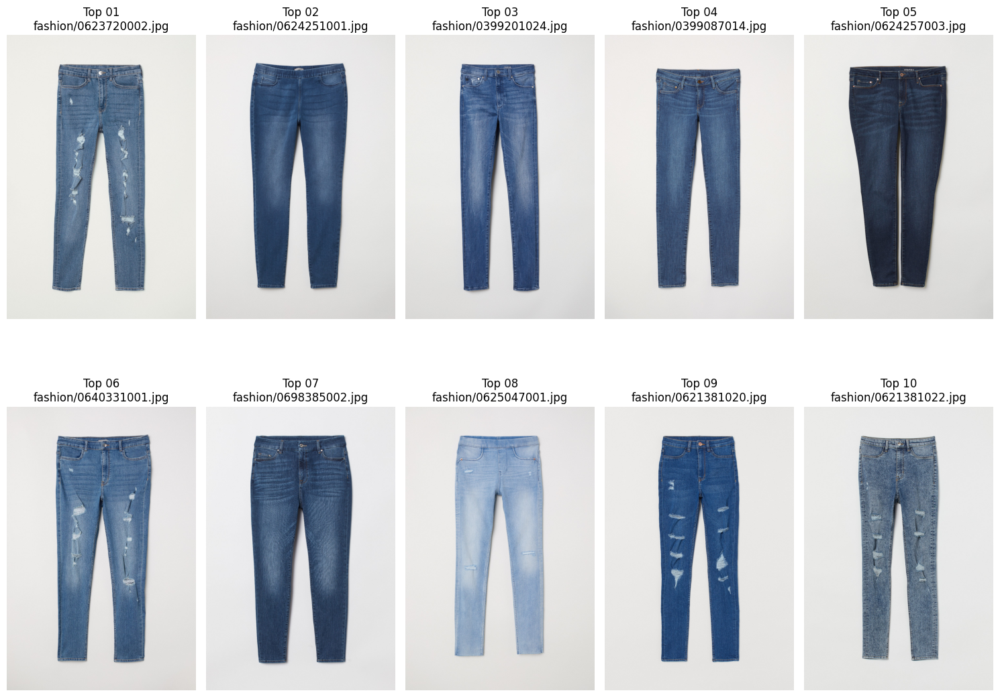

In [42]:
image_url = images_url + "visualsearch%20(7).jpg?raw=true"

images = image_search(image_url, topn=10)
display_images(images, disp_cosine=False, source="image")


Reference image: https://github.com/retkowsky/images/blob/master/visualsearch%20(8).jpg?raw=true


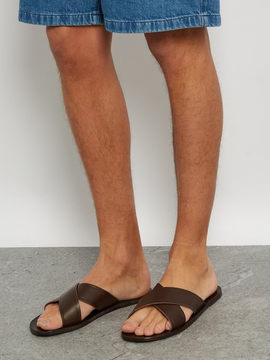

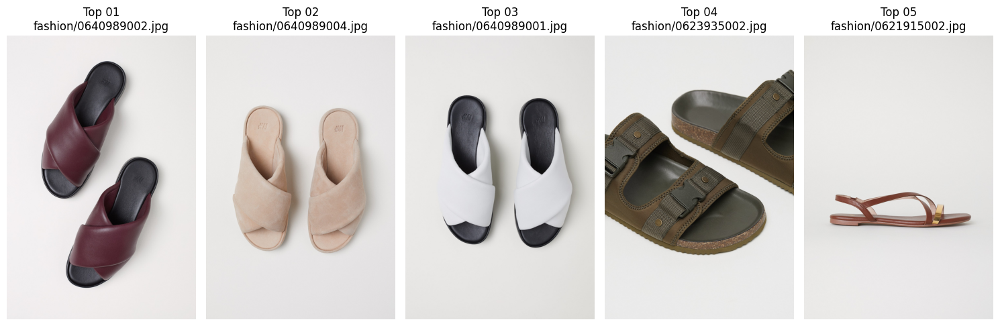

In [43]:
image_url = images_url + "visualsearch%20(8).jpg?raw=true"

images = image_search(image_url)
display_images(images, disp_cosine=False, source="image")


Reference image: https://th.bing.com/th/id/OIP.A5wlUxfgHA8b4TTG_kqTvwHaEK?pid=ImgDet&rs=1


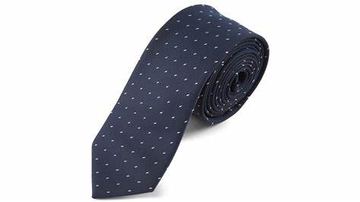

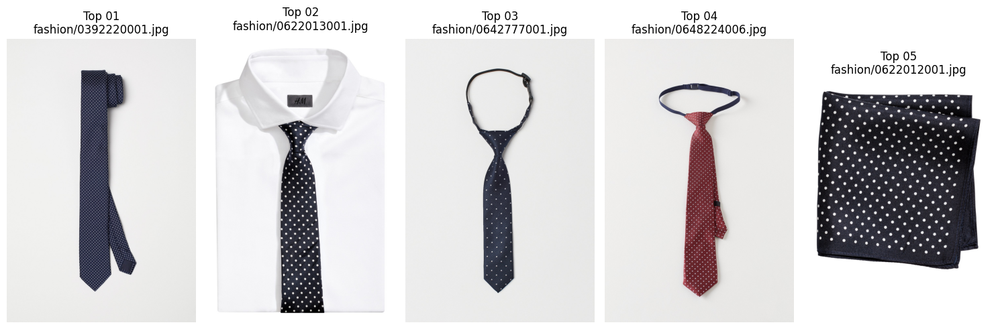

In [44]:
image_url = "https://th.bing.com/th/id/OIP.A5wlUxfgHA8b4TTG_kqTvwHaEK?pid=ImgDet&rs=1"

images = image_search(image_url)
display_images(images, disp_cosine=False, source="image")

## 7. Post processing

We can delete the index if needed

In [45]:
index_status(index_name)

Azure Cognitive Search Index: azure-fashion-demo 

{
     "@odata.context": "https://azurecogsearcheastussr.search.windows.net/$metadata#indexes/$entity",
     "@odata.etag": "\"0x8DB762519A6CB75\"",
     "name": "azure-fashion-demo",
     "defaultScoringProfile": null,
     "fields": [
          {
               "name": "idfile",
               "type": "Edm.String",
               "searchable": false,
               "filterable": false,
               "retrievable": true,
               "sortable": false,
               "facetable": false,
               "key": true,
               "indexAnalyzer": null,
               "searchAnalyzer": null,
               "analyzer": null,
               "normalizer": null,
               "synonymMaps": []
          },
          {
               "name": "imagefile",
               "type": "Edm.String",
               "searchable": true,
               "filterable": false,
               "retrievable": true,
               "sortable": false,
        

In [46]:
index_stats(index_name)

Azure Cognitive Search index status for: azure-fashion-demo 

{
  "@odata.context": "https://azurecogsearcheastussr.search.windows.net/$metadata#Microsoft.Azure.Search.V2021_04_30_Preview.IndexStatistics",
  "documentCount": 10226,
  "storageSize": 155602873
}


In [47]:
#delete_index(index_name)